In [1]:
import os
import cv2
import matplotlib.pyplot as plt

In [14]:
def show_compara_fig(img1,img2,fig1title,fig2title,savename=None):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9, 6),sharex=True, sharey=True)
    ax[0].imshow(img1)
    ax[0].axis('off')
    ax[0].set_title(fig1title)
    ax[1].imshow(img2)
    ax[1].axis('off')
    ax[1].set_title(fig2title)
    fig.tight_layout()
    if savename:
        plt.savefig(savename)
    plt.show()

def sp_noise(image,prob):
  '''
  添加椒盐噪声
  prob:噪声比例 
  '''
  import numpy as np
  import random
  output = np.zeros(image.shape,np.uint8)
  thres = 1 - prob 
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      rdn = random.random()
      if rdn < prob:
        output[i][j] = 0
      elif rdn > thres:
        output[i][j] = 255
      else:
        output[i][j] = image[i][j]
  return output

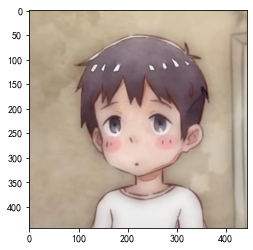

In [3]:
my_dir = "E:/CV/code/data"
file = os.path.join(my_dir, 'icon.png')
my_img = cv2.imread(file)
my_img = cv2.cvtColor(my_img,cv2.COLOR_BGR2RGB)
plt.imshow(my_img)
plt.show()

In [15]:

# 随机加入椒盐噪声，比例为0.2333
sp_img = sp_noise(my_img,0.2333)

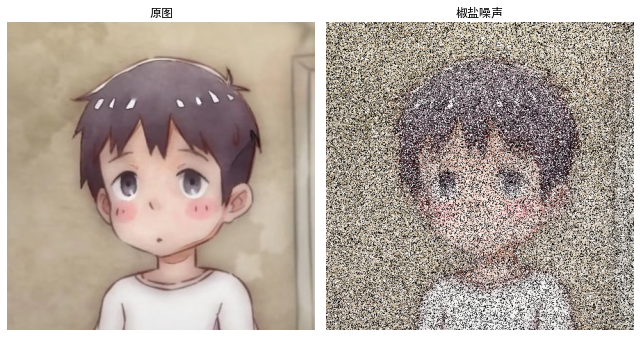

In [16]:
show_compara_fig(my_img,sp_img,"原图","椒盐噪声","椒盐噪声前后对比图.png")

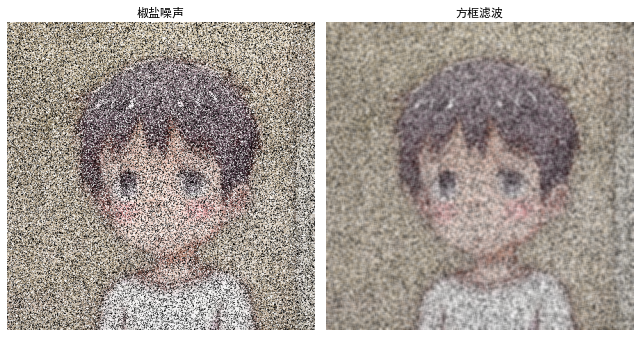

In [17]:
# 滤波

# 方框滤波
# 使用opencv实现
box_img = cv2.boxFilter(sp_img,-1,(5,5),True)
show_compara_fig(sp_img,box_img,"椒盐噪声","方框滤波","椒盐+方框.png")

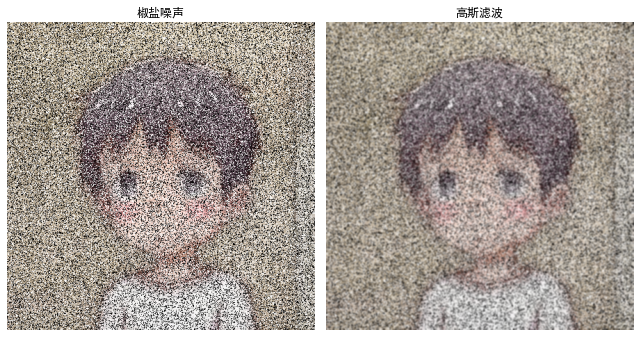

In [18]:
# 高斯滤波
gaussian_img = cv2.GaussianBlur(sp_img,(5,5),0)
show_compara_fig(sp_img,gaussian_img,"椒盐噪声","高斯滤波","椒盐+高斯.png")

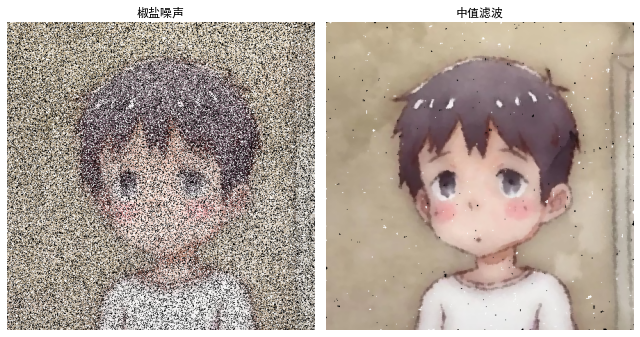

In [19]:

# 中值滤波
# from skimage.filters import median
# from skimage.morphology import disk
# median_img = median(salt_noise_grey_img,disk(5))

# import scipy.signal as signal
# median_img = signal.medfilt(salt_noise_img,5)
median_img = cv2.medianBlur(sp_img,5)
show_compara_fig(sp_img,median_img,"椒盐噪声","中值滤波","椒盐+中值.png")

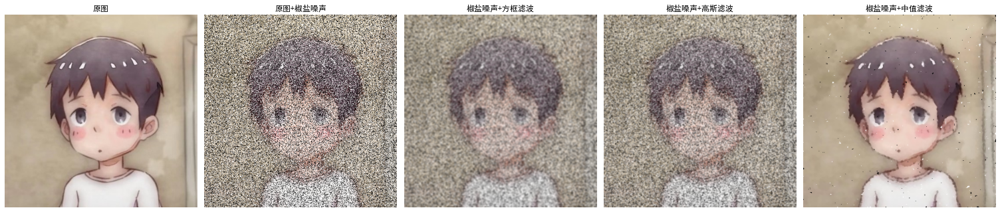

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(21, 6),sharex=True, sharey=True)
ax[0].imshow(my_img)
ax[0].axis('off')
ax[0].set_title("原图")
ax[1].imshow(sp_img)
ax[1].axis('off')
ax[1].set_title("原图+椒盐噪声")
ax[2].imshow(box_img)
ax[2].axis('off')
ax[2].set_title("椒盐噪声+方框滤波")
ax[3].imshow(gaussian_img)
ax[3].axis('off')
ax[3].set_title("椒盐噪声+高斯滤波")
ax[4].imshow(median_img)
ax[4].axis('off')
ax[4].set_title("椒盐噪声+中值滤波")
fig.tight_layout()
plt.savefig("原图+椒盐+方框+高斯+中值对比图.png")
plt.show()

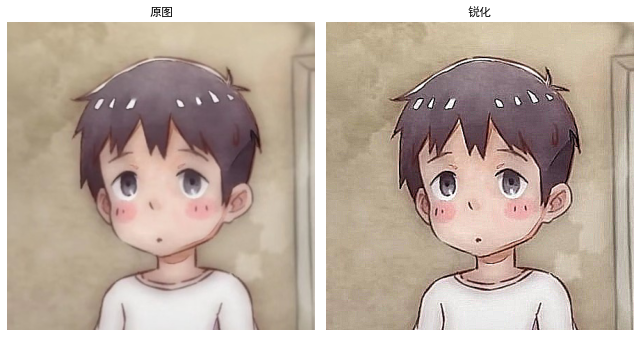

In [24]:
import numpy as np
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]], np.float32)
# sharpen_img = cv2.filter2D(sp_img, -1, kernel)
# show_compara_fig(sp_img,sharpen_img,"+椒盐噪声","椒盐+锐化")

# sharpen_median_img = cv2.filter2D(median_img, -1, kernel)
# show_compara_fig(median_img,sharpen_median_img,"中值滤波","中值滤波+锐化")

sharpen_my_img = cv2.filter2D(my_img, -1, kernel)
show_compara_fig(my_img,sharpen_my_img,"原图","锐化","原图+锐化.png")

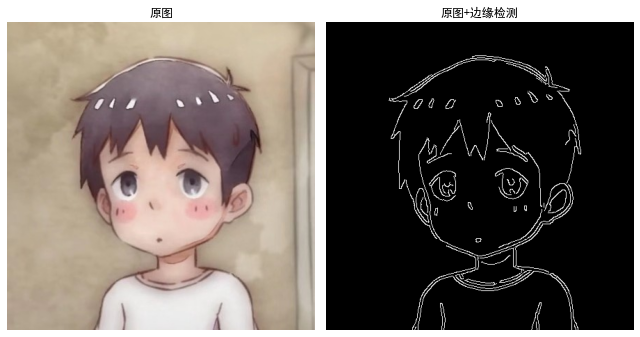

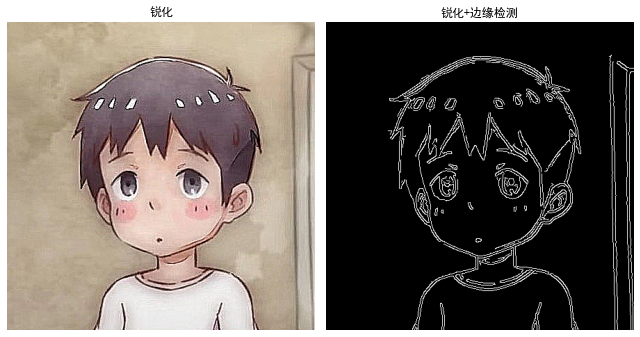

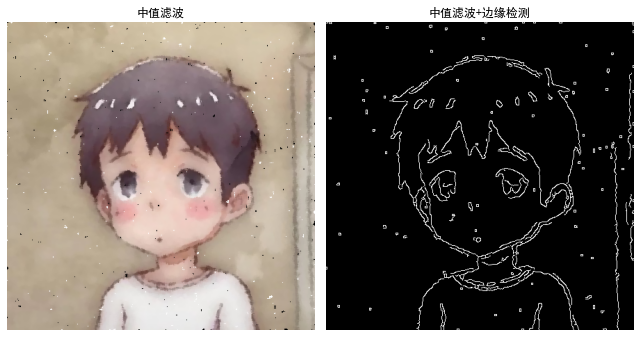

In [26]:
def edge(src_img):
    # 高斯模糊
    blurred=cv2.GaussianBlur(src_img,(5,5),0)
    # 灰度转换
    gray=cv2.cvtColor(blurred,cv2.COLOR_BGR2GRAY)
    # 分别求xy方向梯度
    xgrad=cv2.Sobel(gray,cv2.CV_16SC1,1,0)
    ygrad=cv2.Sobel(gray,cv2.CV_16SC1,0,1)
    # 非最大信号抑制
    edge_dst = cv2.Canny(xgrad,ygrad,50,150)
    # 转换回RGB黑白
    output=cv2.cvtColor(edge_dst,cv2.COLOR_BGR2RGB)
    return output
edge_img = edge(my_img)
show_compara_fig(my_img,edge_img,"原图","原图+边缘检测","原图+边缘检测.png")
edge_img = edge(sharpen_my_img)
show_compara_fig(sharpen_my_img,edge_img,"锐化","锐化+边缘检测")
edge_img = edge(median_img)
show_compara_fig(median_img,edge_img,"中值滤波","中值滤波+边缘检测")

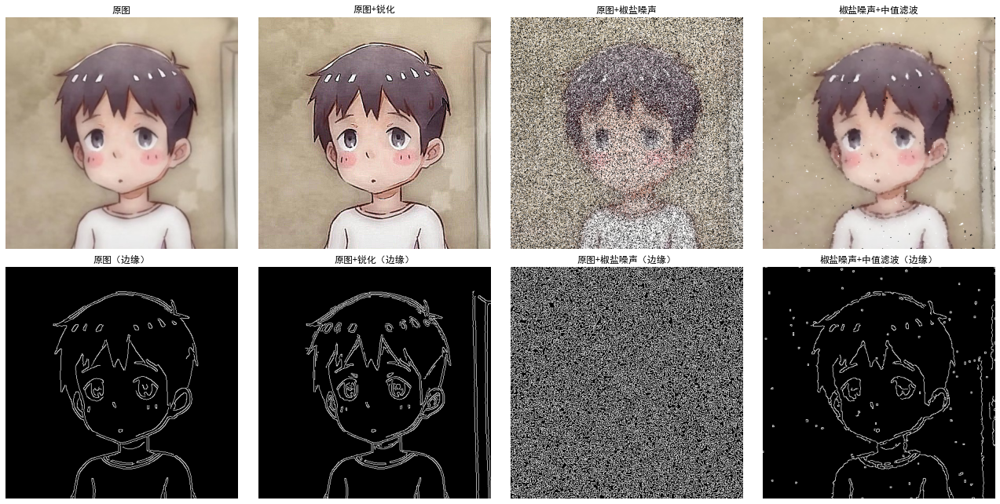

In [29]:
edge_my_img = edge(my_img)
edge_sharpen_img = edge(sharpen_my_img)
edge_sp_img = edge(sp_img)
edge_median_img = edge(median_img)

fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(18, 9),sharex=True, sharey=True)
ax[0,0].imshow(my_img)
ax[0,0].axis('off')
ax[0,0].set_title("原图")
ax[0,1].imshow(sharpen_my_img)
ax[0,1].axis('off')
ax[0,1].set_title("原图+锐化")
ax[0,2].imshow(sp_img)
ax[0,2].axis('off')
ax[0,2].set_title("原图+椒盐噪声")
ax[0,3].imshow(median_img)
ax[0,3].axis('off')
ax[0,3].set_title("椒盐噪声+中值滤波")

ax[1,0].imshow(edge_my_img)
ax[1,0].axis('off')
ax[1,0].set_title("原图（边缘）")
ax[1,1].imshow(edge_sharpen_img)
ax[1,1].axis('off')
ax[1,1].set_title("原图+锐化（边缘）")
ax[1,2].imshow(edge_sp_img)
ax[1,2].axis('off')
ax[1,2].set_title("原图+椒盐噪声（边缘）")
ax[1,3].imshow(edge_median_img)
ax[1,3].axis('off')
ax[1,3].set_title("椒盐噪声+中值滤波（边缘）")

fig.tight_layout()
plt.savefig("原图+锐化+椒盐+中值-边缘对比图.png")
plt.show()